In [11]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from PIL import Image

### Global Variables and Helper Functions:

In [7]:
FRAME_PATH = 'Frames'
DIMENSION = 240
BATCH_SIZE = 32

train_frame = pd.read_pickle(os.path.join(FRAME_PATH, 'train_frame.pickle'))
valid_frame = pd.read_pickle(os.path.join(FRAME_PATH, 'valid_frame.pickle'))
test_frame  = pd.read_pickle(os.path.join(FRAME_PATH, 'test_frame.pickle'))

### Datasets:

In [8]:
class Circle_Dataset(Dataset):
    def __init__(self, df, transform=None):
        self.image_paths = df['file_path'].values
        self.targets = np.array(df[['center_x_ratio', 'center_y_ratio']])
        self.sample_ids = np.array(df.index)
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)
    
    def __getitem__(self, idx):
        image = np.load(self.image_paths[idx])
        image = torch.from_numpy(image).float().unsqueeze(0)
        target = torch.from_numpy(self.targets[idx]).float()
        sample_ids = torch.tensor(self.sample_ids[idx])
        if self.transform is not None:
            image = self.transform(image)
        return image, target, sample_ids
    
    def view_item(self, idx):
        image = np.load(self.image_paths[idx])
        plt.imshow(image, cmap='gray')
        plt.show()


CDS_train = Circle_Dataset(df=train_frame)
CDS_valid = Circle_Dataset(df=valid_frame)
CDS_test = Circle_Dataset(df=test_frame)

### Dataloader:

In [9]:
train_dataloader = DataLoader(dataset=CDS_train, batch_size=BATCH_SIZE, shuffle=True)
valid_dataloader = DataLoader(dataset=CDS_valid, batch_size=BATCH_SIZE, shuffle=True)
test_dataloader = DataLoader(dataset=CDS_test, batch_size=BATCH_SIZE, shuffle=False)


#_______/Test Output\________
img_custom, label_custom, sample_ids = next(iter(train_dataloader))

print(f'Image shape: {img_custom.shape} -> [batch_size, color channels, height, width]')
print(f'Label shape: {label_custom.shape}')
print(f'Sample_ids shape: {sample_ids.shape}')

Image shape: torch.Size([10, 1, 240, 240]) -> [batch_size, color channels, height, width]
Label shape: torch.Size([10, 2])
Sample_ids shape: torch.Size([10])


GROUND TRUTH center coordinate (x,y): [121, 115]
PREDICTED center coordinate (x,y): [120, 120]


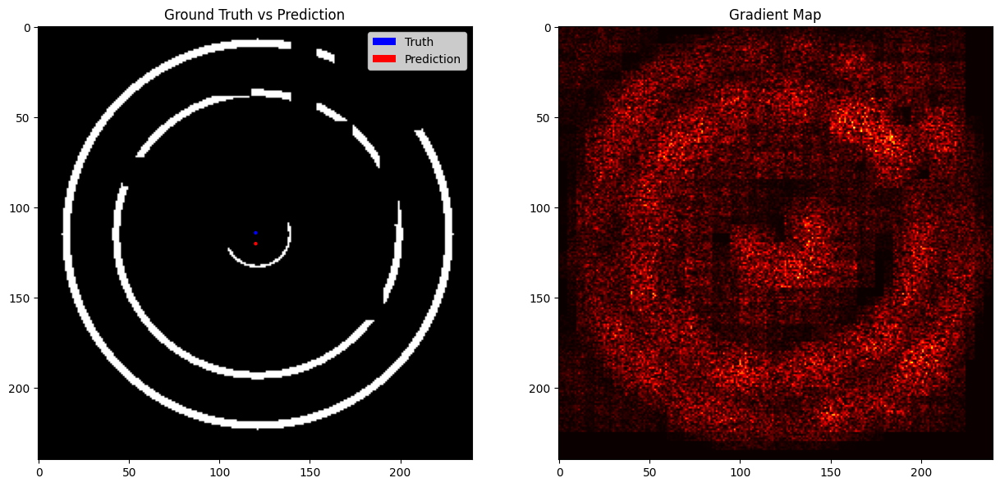

Epoch: 1 	Training Loss: 0.0037638209760189056 	Validation Loss: 0.0029193772934377193
GROUND TRUTH center coordinate (x,y): [121, 115]
PREDICTED center coordinate (x,y): [118, 127]


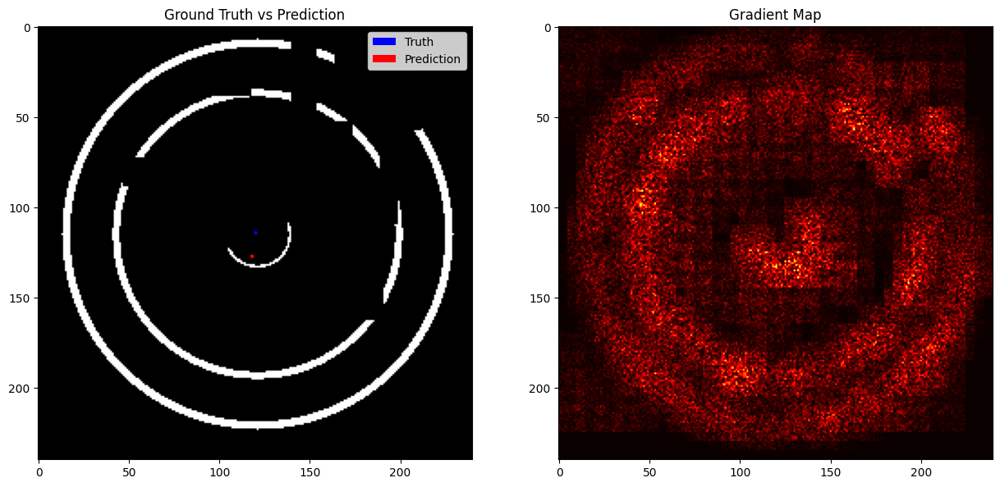

Epoch: 2 	Training Loss: 0.0025670279283076525 	Validation Loss: 0.004427538253366947
GROUND TRUTH center coordinate (x,y): [111, 120]
PREDICTED center coordinate (x,y): [120, 125]


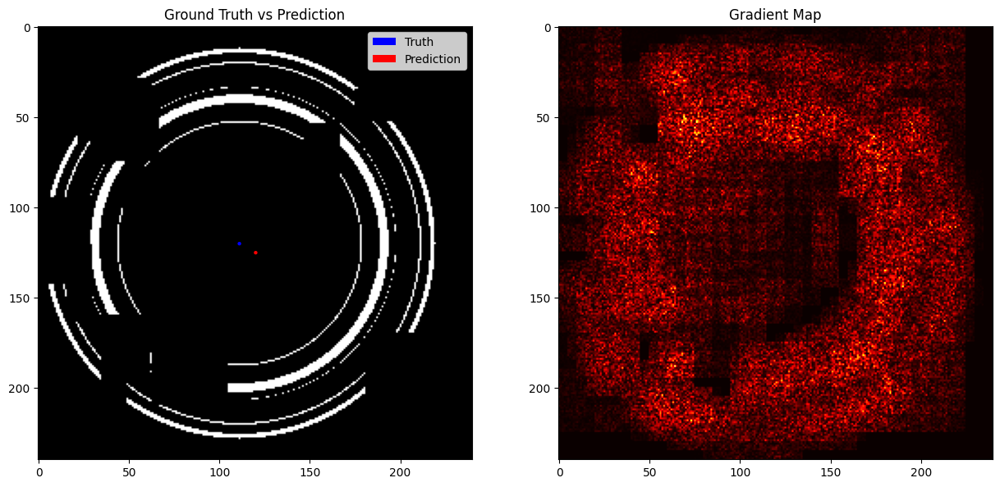

Epoch: 3 	Training Loss: 0.0021995126735419035 	Validation Loss: 0.004330762661993504
GROUND TRUTH center coordinate (x,y): [109, 102]
PREDICTED center coordinate (x,y): [120, 124]


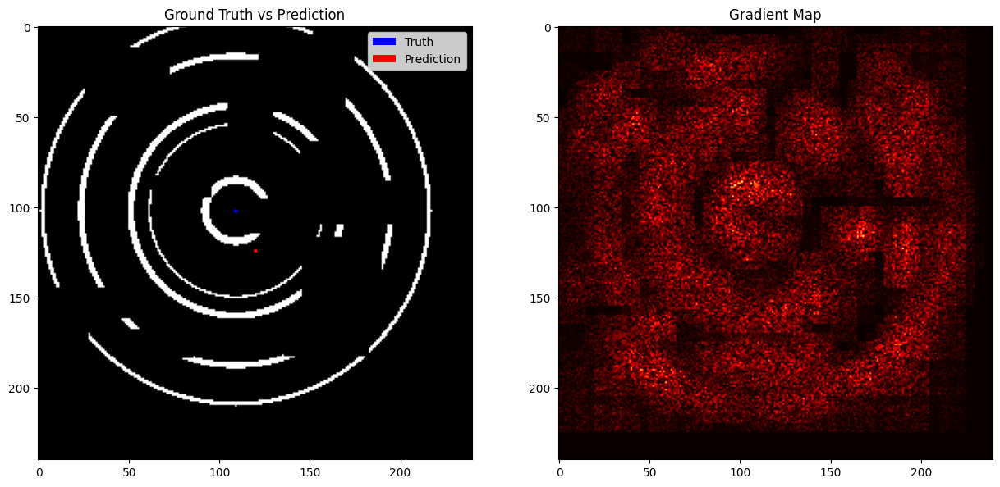

Epoch: 4 	Training Loss: 0.0018384518334642053 	Validation Loss: 0.0037514236755669117
GROUND TRUTH center coordinate (x,y): [111, 120]
PREDICTED center coordinate (x,y): [122, 118]


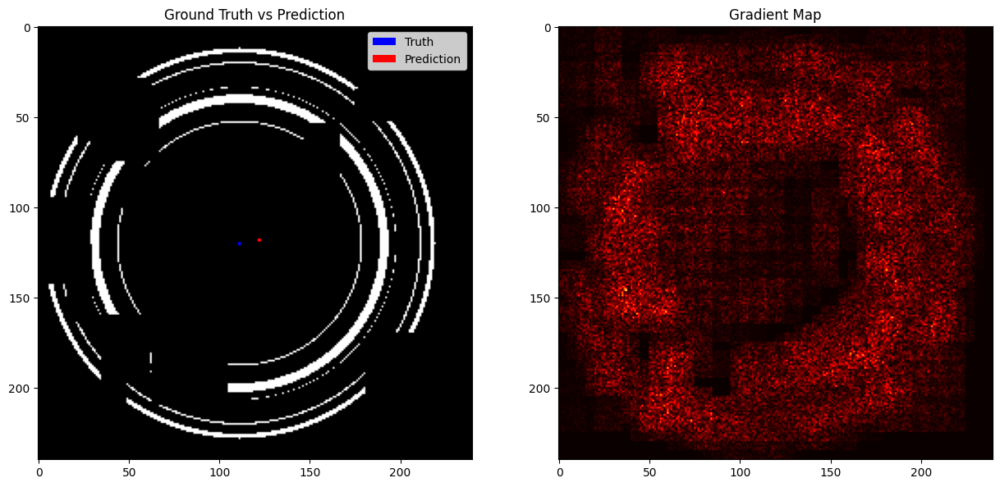

Epoch: 5 	Training Loss: 0.0014450106536969543 	Validation Loss: 0.003326520323753357
GROUND TRUTH center coordinate (x,y): [109, 102]
PREDICTED center coordinate (x,y): [118, 121]


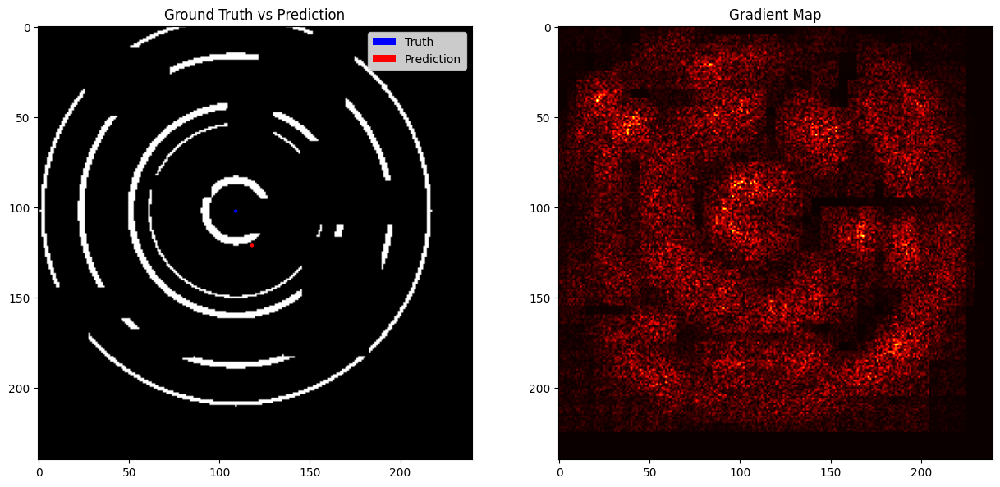

Epoch: 6 	Training Loss: 0.0010895151644945145 	Validation Loss: 0.003355767112225294
GROUND TRUTH center coordinate (x,y): [135, 109]
PREDICTED center coordinate (x,y): [114, 115]


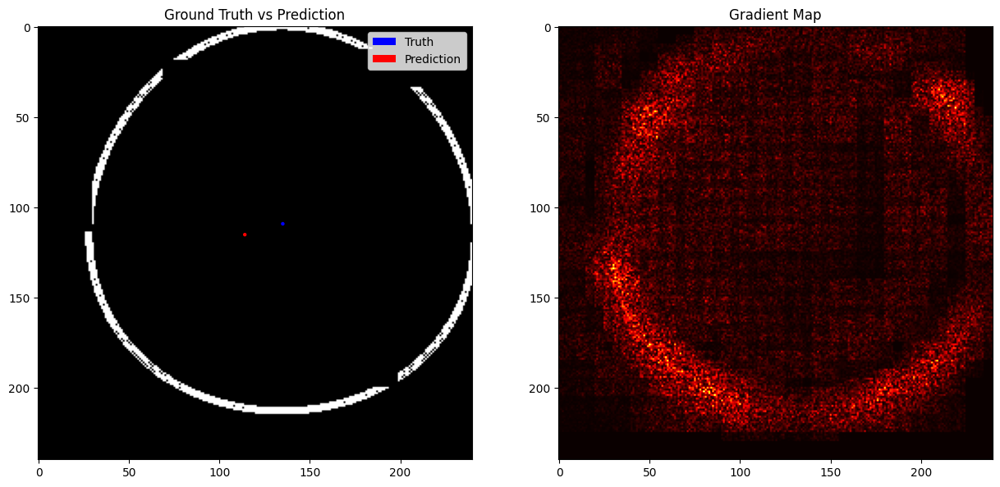

Epoch: 7 	Training Loss: 0.0007064262754283845 	Validation Loss: 0.003524900646880269
GROUND TRUTH center coordinate (x,y): [121, 115]
PREDICTED center coordinate (x,y): [116, 113]


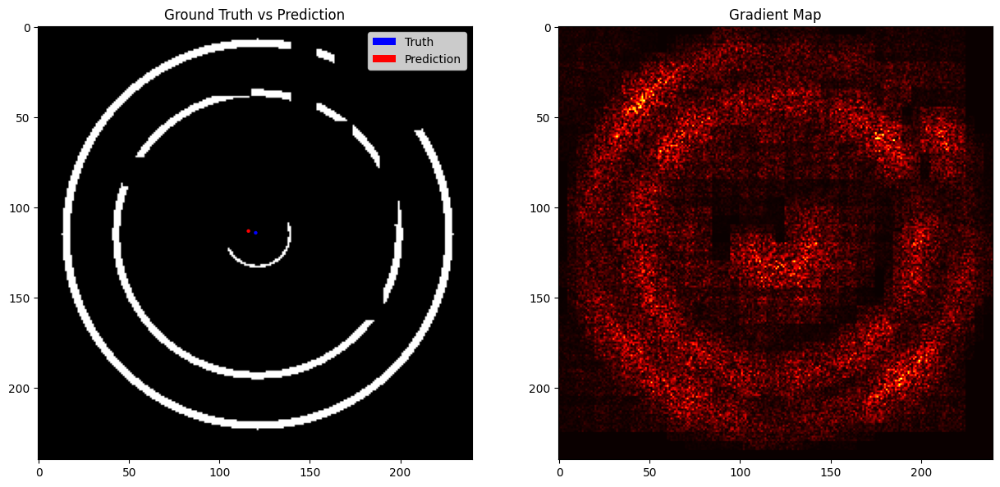

Epoch: 8 	Training Loss: 0.0004956367192789912 	Validation Loss: 0.002994082635268569
GROUND TRUTH center coordinate (x,y): [126, 100]
PREDICTED center coordinate (x,y): [120, 115]


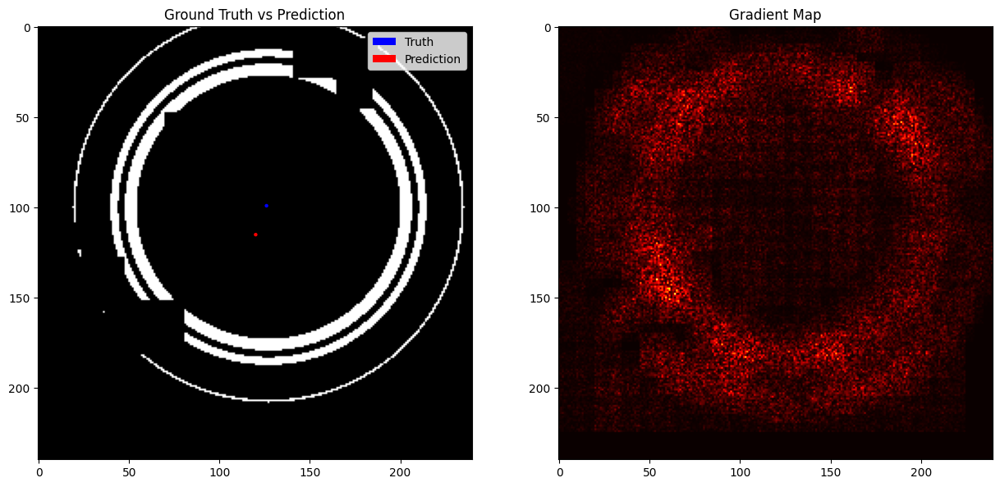

Epoch: 9 	Training Loss: 0.00034127492108382285 	Validation Loss: 0.003464270383119583
GROUND TRUTH center coordinate (x,y): [111, 120]
PREDICTED center coordinate (x,y): [112, 113]


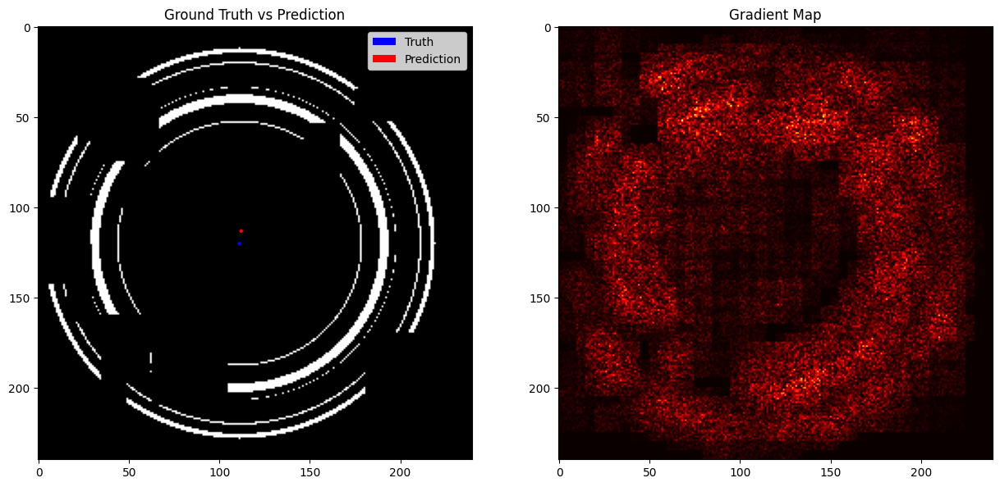

Epoch: 10 	Training Loss: 0.0005075684748589993 	Validation Loss: 0.0034624722320586443
GROUND TRUTH center coordinate (x,y): [120, 109]
PREDICTED center coordinate (x,y): [135, 121]


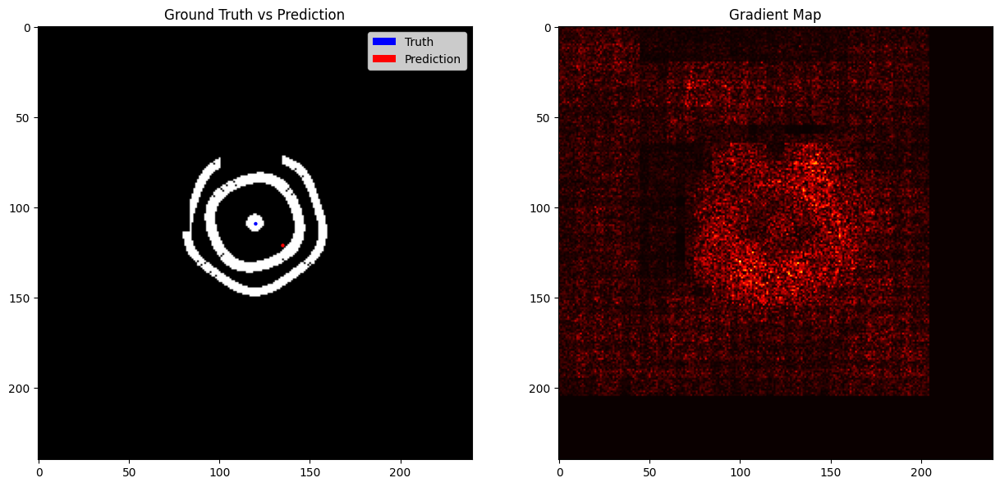

Epoch: 11 	Training Loss: 0.001255750423297286 	Validation Loss: 0.0028014585841447115
GROUND TRUTH center coordinate (x,y): [126, 142]
PREDICTED center coordinate (x,y): [137, 137]


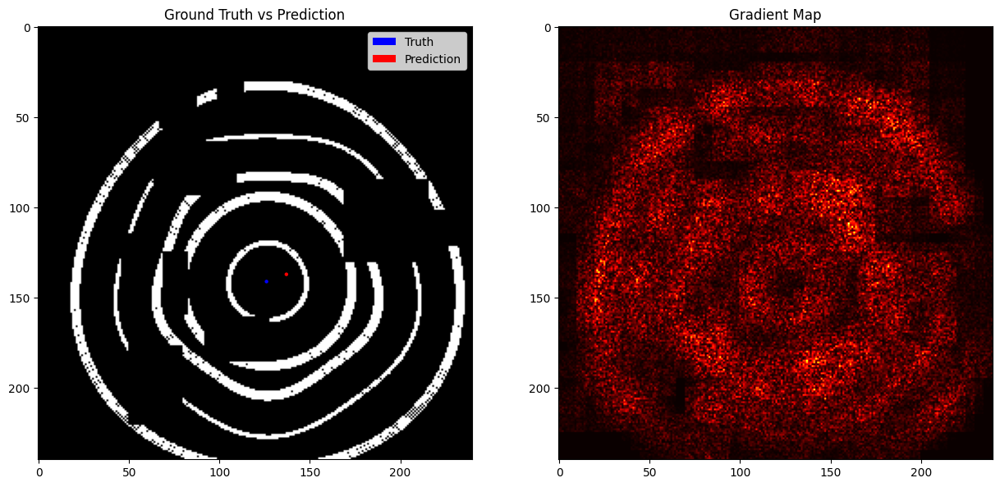

Epoch: 12 	Training Loss: 0.00018391218327451497 	Validation Loss: 0.003577031660825014
GROUND TRUTH center coordinate (x,y): [135, 109]
PREDICTED center coordinate (x,y): [116, 115]


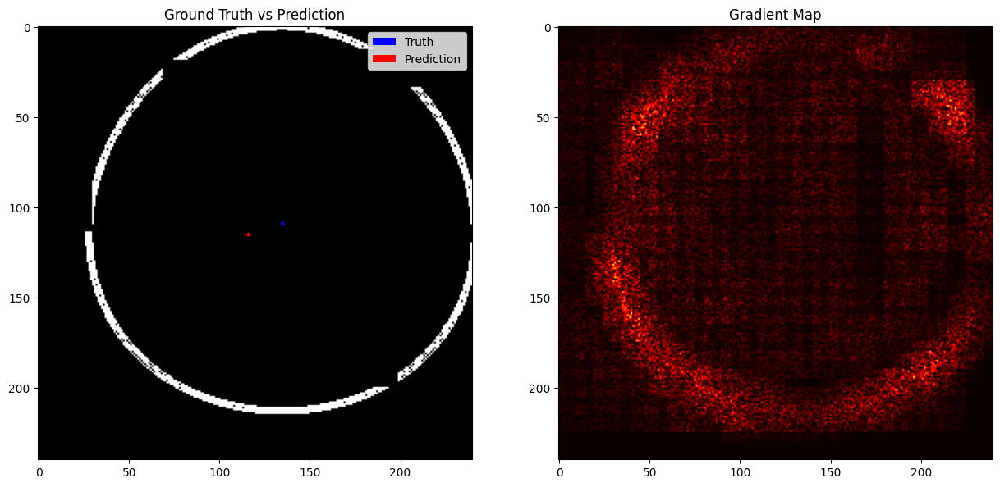

Epoch: 13 	Training Loss: 0.0007272496004588902 	Validation Loss: 0.0028459536843001842
GROUND TRUTH center coordinate (x,y): [126, 100]
PREDICTED center coordinate (x,y): [115, 113]


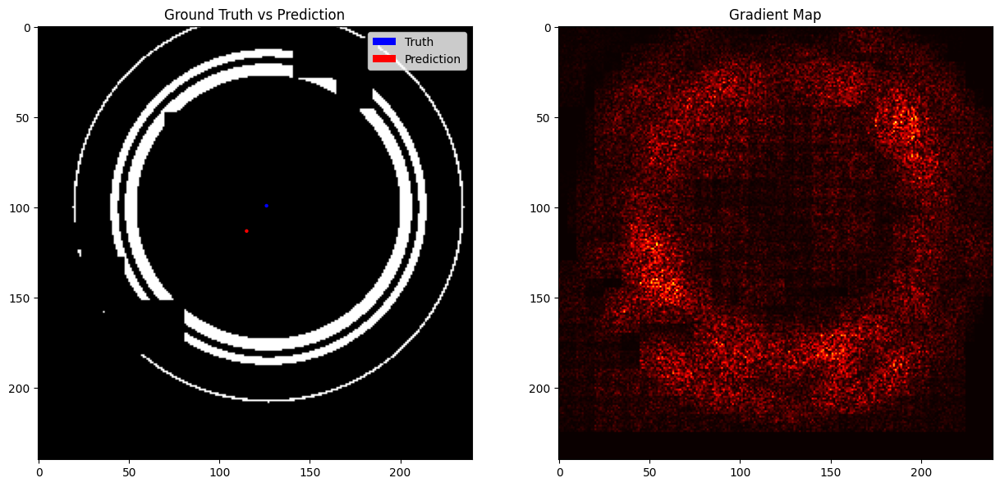

Epoch: 14 	Training Loss: 0.0002692137495614588 	Validation Loss: 0.0023890123702585697
GROUND TRUTH center coordinate (x,y): [112, 106]
PREDICTED center coordinate (x,y): [112, 110]


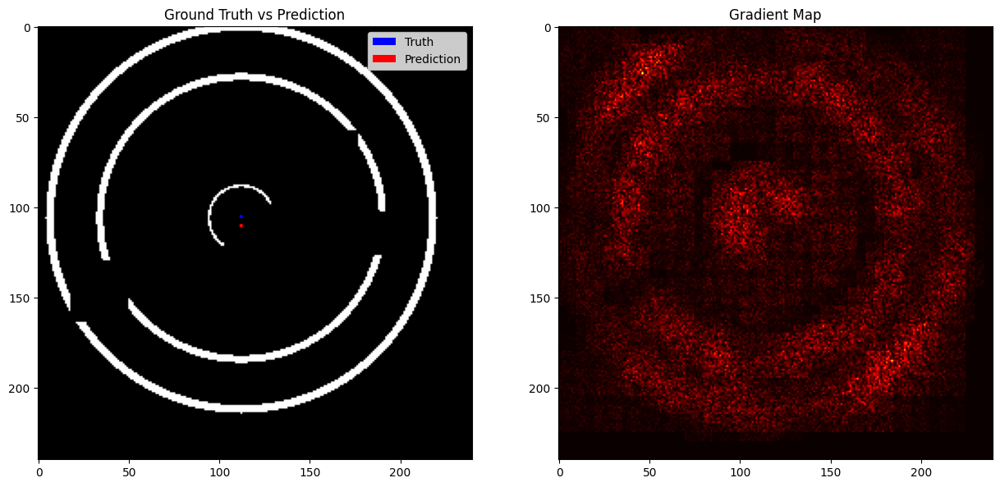

Epoch: 15 	Training Loss: 0.00018064427422359586 	Validation Loss: 0.0024712365120649338
GROUND TRUTH center coordinate (x,y): [112, 106]
PREDICTED center coordinate (x,y): [112, 111]


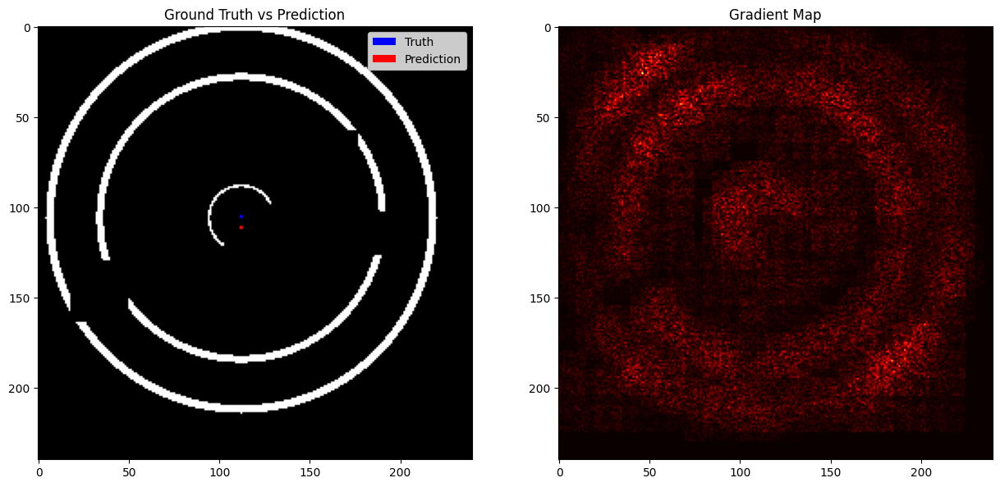

Epoch: 16 	Training Loss: 0.0003470076189842075 	Validation Loss: 0.0026096892543137074
GROUND TRUTH center coordinate (x,y): [135, 109]
PREDICTED center coordinate (x,y): [116, 114]


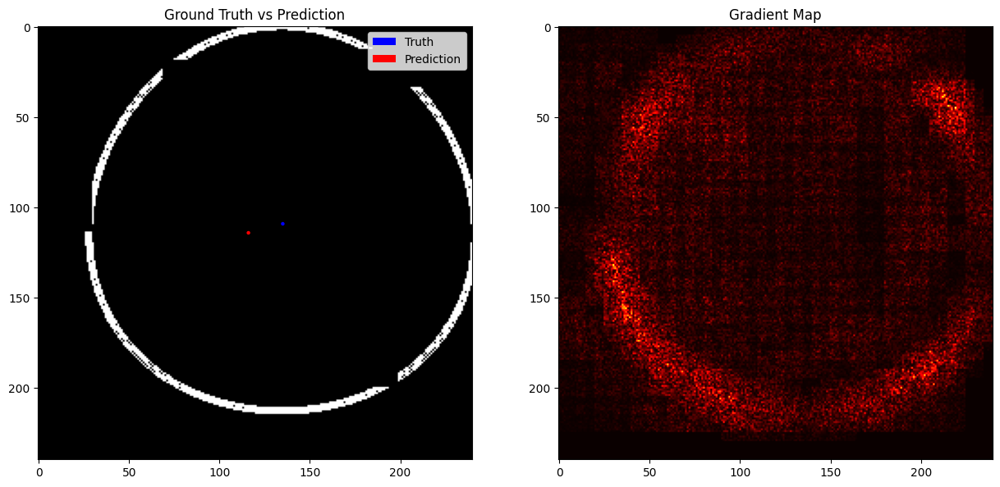

Epoch: 17 	Training Loss: 0.00027396323275752366 	Validation Loss: 0.0027403600979596376
GROUND TRUTH center coordinate (x,y): [120, 98]
PREDICTED center coordinate (x,y): [129, 126]


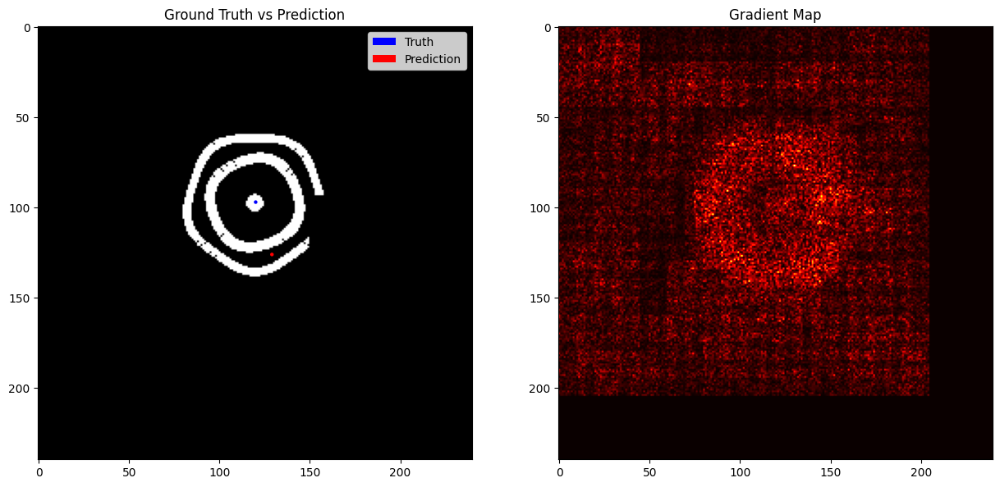

Epoch: 18 	Training Loss: 0.00015697321214247495 	Validation Loss: 0.002788951387628913
GROUND TRUTH center coordinate (x,y): [121, 115]
PREDICTED center coordinate (x,y): [122, 114]


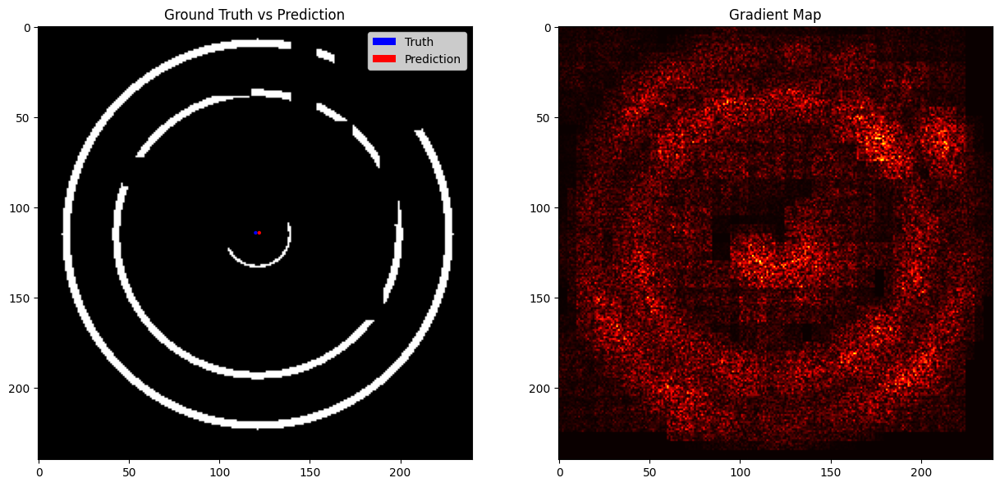

Epoch: 19 	Training Loss: 0.00013771388330496848 	Validation Loss: 0.002643870422616601
GROUND TRUTH center coordinate (x,y): [109, 102]
PREDICTED center coordinate (x,y): [121, 112]


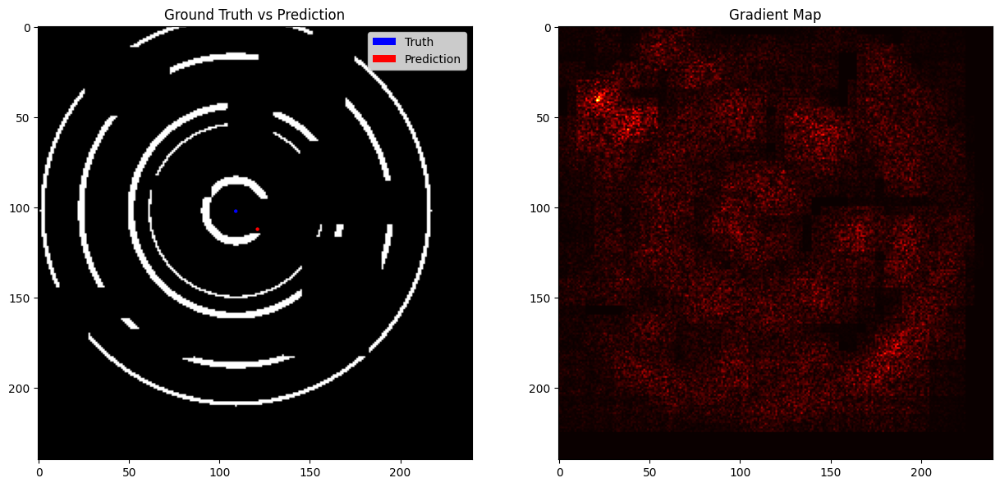

Epoch: 20 	Training Loss: 0.00014413036115001887 	Validation Loss: 0.002388361608609557
GROUND TRUTH center coordinate (x,y): [120, 98]
PREDICTED center coordinate (x,y): [130, 123]


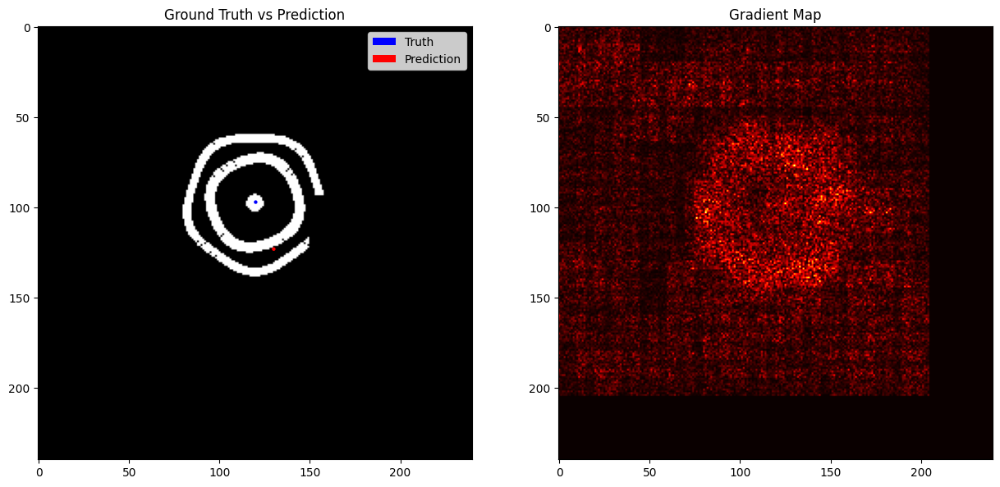

Epoch: 21 	Training Loss: 0.0001323091273661703 	Validation Loss: 0.002160451142117381
GROUND TRUTH center coordinate (x,y): [109, 102]
PREDICTED center coordinate (x,y): [119, 108]


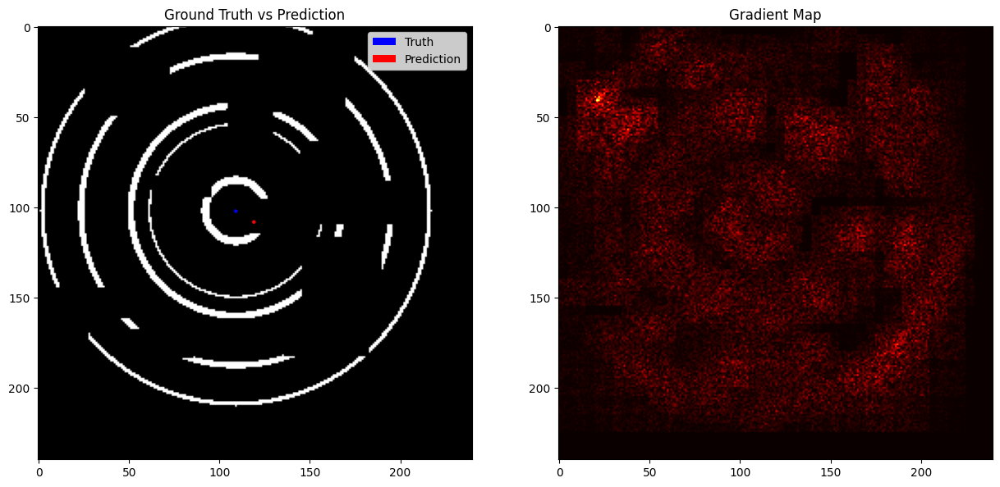

Epoch: 22 	Training Loss: 0.00011573716619750485 	Validation Loss: 0.002032865770161152
GROUND TRUTH center coordinate (x,y): [120, 98]
PREDICTED center coordinate (x,y): [130, 122]


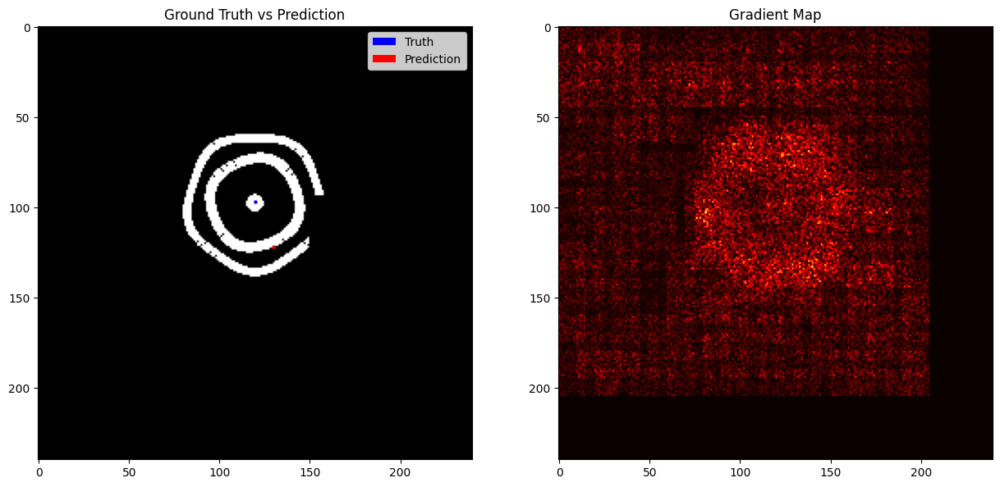

Epoch: 23 	Training Loss: 8.754712325753644e-05 	Validation Loss: 0.002004781039431691
GROUND TRUTH center coordinate (x,y): [120, 98]
PREDICTED center coordinate (x,y): [130, 123]


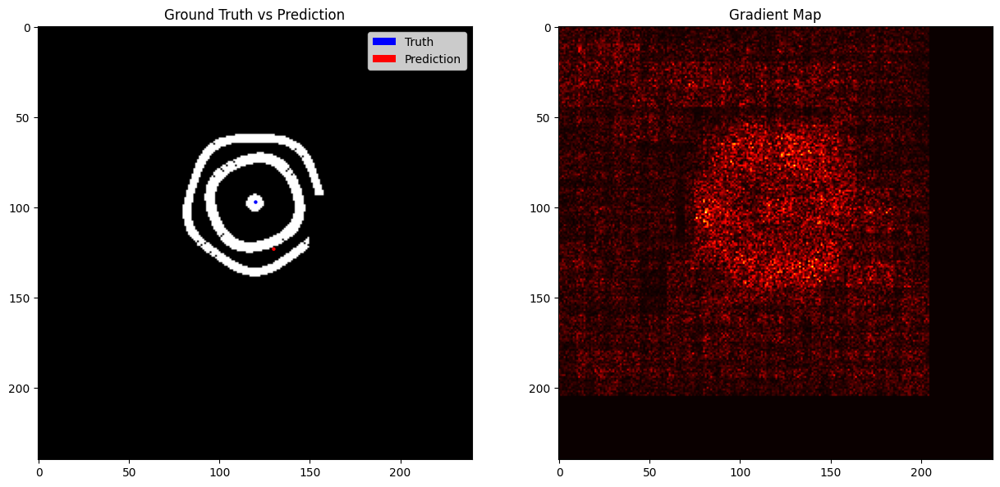

Epoch: 24 	Training Loss: 5.2667710406240076e-05 	Validation Loss: 0.0020522670820355415
GROUND TRUTH center coordinate (x,y): [126, 100]
PREDICTED center coordinate (x,y): [115, 111]


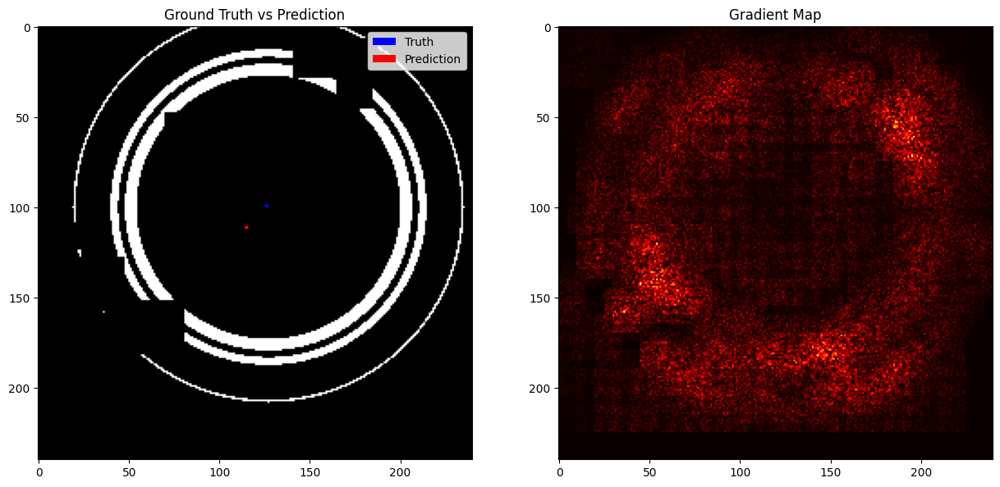

Epoch: 25 	Training Loss: 3.899918374372646e-05 	Validation Loss: 0.0021288194693624973


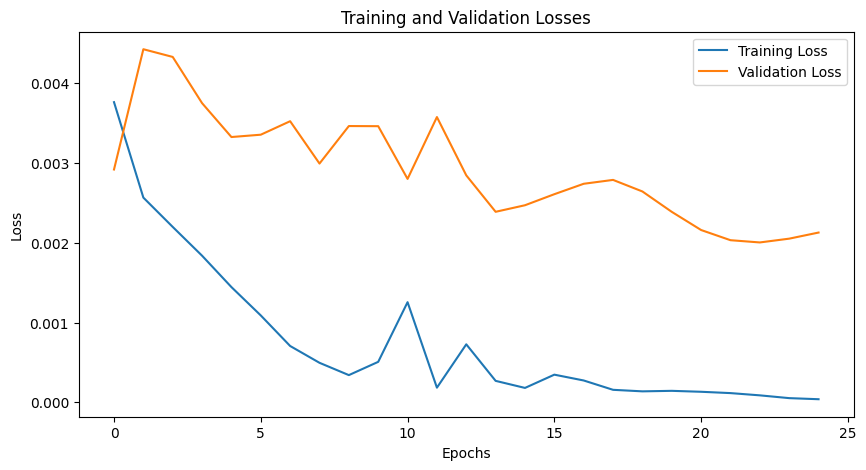

In [13]:
#______________________________/Model Architecture\_______________________________
class CircleNet(nn.Module):
    def __init__(self):
        super(CircleNet, self).__init__()

        self.features = nn.Sequential(
            nn.Conv2d(1, 30, kernel_size=int(DIMENSION/16), stride=5, padding=0),
            nn.MaxPool2d(kernel_size=4, stride=2),
            nn.ReLU(inplace=True),
            nn.Conv2d(30, 60, kernel_size=4, stride=2, padding=0),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.ReLU(inplace=True)
        )

        self.regressor = nn.Sequential(
            nn.Linear(60 * 5 * 5, 120),
            nn.ReLU(inplace=True),
            nn.Linear(120, 60),
            nn.ReLU(inplace=True),
            nn.Linear(60, 2),
            nn.Sigmoid()
        )

    def forward(self, x):
        x = self.features(x)
        self.feature_maps = x.detach()
        x = x.view(x.size(0), -1)
        x = self.regressor(x)
        return x

#_______________________________\____________________/__________________________________

#_______________________________/Model Initialization\__________________________________
model = CircleNet()
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

num_epochs = 25
visual_frequency = 1

train_losses = []
valid_losses = []

# Check if CUDA is available and set device to GPU if it is
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# Move your model to the device
model = model.to(device)


#__________________________________/Training Sequence\_________________________________________
for epoch in range(num_epochs):

    train_loss = 0.0 # Initialize loss variables for current epoch
    valid_loss = 0.0 

    #---Train Step---#
    model.train()
    for images, targets, sample_ids in train_dataloader:

        images = images.to(device)   
        targets = targets.to(device) # load data to device (gpu if cuda, else cpu)

        outputs = model(images) # run input data through model --> predictions
        loss = criterion(outputs, targets) # evaluate predictions against ground truths using some criterion
 
        optimizer.zero_grad() # clear previous batch gradients

        loss.backward() # calculate gradients and perform back propogation
        optimizer.step() # update parameters in accordance with current gradient information

        train_loss += loss.item() * images.size(0) # Accumulate training batch loss into running total



    #---Validation Step---#
    model.eval()

    if epoch % visual_frequency == 0:
        visuals_displayed = True # Flag for visual aids at the epoch frequency basis

    for images, targets, sample_ids in valid_dataloader:

        images = images.to(device)
        targets = targets.to(device) # loading data

        outputs = model(images) # create predictions
        loss = criterion(outputs, targets) # evaluate predictions and determine loss

        valid_loss += loss.item() * images.size(0) # Accumulate validation batch loss into running total


        #-----------------------------/Visualizations\-----------------------------
        if visuals_displayed:
            
            image = images[0].unsqueeze(0)  # Choose one image from the batch
            image.requires_grad = True

            ex_output = model(image)  # Forward pass
            ex_loss = criterion(ex_output, targets[0].unsqueeze(0))  # Compute loss

            model.zero_grad()

            ex_loss.backward()  # Backward pass to compute gradients

            gradients = image.grad.abs().squeeze().cpu().numpy()  # Get the gradients

            # Resize the heatmap
            heatmap_pil = Image.fromarray(gradients)
            heatmap_resized = heatmap_pil.resize((DIMENSION, DIMENSION))

            # Convert back to numpy array
            heatmap = np.array(heatmap_resized)

            

            fig, axs = plt.subplots(1, 2, figsize=(15,7))  # create a figure with 3 subplots

            # Display original image with ground truth pixel highlighted
            image_np = images[0].squeeze().cpu().numpy()  # convert the image tensor to numpy array
            axs[0].imshow(image_np, cmap='gray')  # display the image

            ground_truth = targets[0].cpu().numpy()  # get the ground truth pixel coordinates
            print(f'GROUND TRUTH center coordinate (x,y): {[int(component) for component in DIMENSION * ground_truth]}')
            predicted = ex_output[0].detach().cpu().numpy()  # get the predicted pixel coordinates
            print(f'PREDICTED center coordinate (x,y): {[int(component) for component in DIMENSION *predicted]}')

            Truth = mpatches.Circle((int(DIMENSION * ground_truth[0]),
                                     int(DIMENSION * ground_truth[1])), radius=1, facecolor='blue')  # create a blue circle at ground truth pixel
            Prediction = mpatches.Circle((int(DIMENSION * predicted[0]), 
                                          int(DIMENSION * predicted[1])), radius=1, facecolor='red')  # create a red circle at predicted pixel
            
            axs[0].add_patch(Truth) 
            axs[0].add_patch(Prediction) # Add truth/predicted pixel markers

            proxy_T = mpatches.Circle((int(DIMENSION * ground_truth[0]),
                                     int(DIMENSION * ground_truth[1])), radius=1, facecolor='blue', label='Truth')
            proxy_P = mpatches.Circle((int(DIMENSION * predicted[0]), 
                                          int(DIMENSION * predicted[1])), radius=1, facecolor='red', label='Prediction')

            axs[0].legend(handles=[proxy_T, proxy_P])
            axs[0].set_title("Ground Truth vs Prediction")

            # Display gradient map
            axs[1].imshow(heatmap, cmap='hot')  # display the gradient map
            axs[1].set_title("Gradient Map")

            plt.show()

        visuals_displayed = False
        # ----------------------------------------------------------------------

    train_loss = train_loss / len(train_dataloader.dataset) # Calculate average training loss for the epoch across all batches
    valid_loss = valid_loss / len(valid_dataloader.dataset) # Calculate averagre validation loss for the epoch across all batches
    
    train_losses.append(train_loss)
    valid_losses.append(valid_loss)


    print(f'Epoch: {epoch+1} \tTraining Loss: {train_loss} \tValidation Loss: {valid_loss}')

    write_to_df = False

plt.figure(figsize=(10,5))
plt.plot(train_losses, label='Training Loss')
plt.plot(valid_losses, label='Validation Loss')
plt.title('Training and Validation Losses')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()